# Compared Activation Maximization Techniques

In this notebook, we present the **Monosemantic Evaluation** procedure applied to the Activation Maximization (AM) techniques studied in the paper.

Although recent attention on *Hidden Semantics* has shifted towards concept-based explanations, AM remains one of the historical and widely discussed approaches to model interpretability.

Our goal is to understand the behavior of a specific neuron, represented by the function  
$n(\mathbf{x}, \theta)$ where $\mathbf{x}$ is an input (in this case, an image) and $\theta$ are the network parameters. We aim to find  

$$
\mathbf{x}^{\star} = \arg \max_{\mathbf{x}} \Big( n(\mathbf{x}, \theta) - \lambda \, \Omega(\mathbf{x}) \Big)
$$  

Here, $\Omega(\mathbf{x})$ denotes a regularization term, and $\lambda$ is a hyperparameter controlling the strength of the regularization.

---

## How to Evaluate AM Techniques?

This paper provides an evaluation of AM approaches. One possible way to assess the behavior of a technique is by contrasting the retrieved semantics with a ground truth. The last layer offers a clear view of predefined semantics. For example, if a neuron is classifying *flamingos*, then the semantics of this neuron should correspond to “flamingo.”

By leveraging the last layer, we can extract semantics through three complementary strategies:  
1. **Class prediction** (*Transferability accuracy* ($m_a$)): predicting the class of the generated image.  
2. **Text similarity** ($m_{TS}$): comparing the image caption with the ground truth using semantic similarity metrics.  
3. **Multimodal alignment** (*CLIP score* ($m_{CLIP}$)): comparing the generated image with the label using CLIP embeddings.  

See the reference image below for an illustration of this evaluation process.



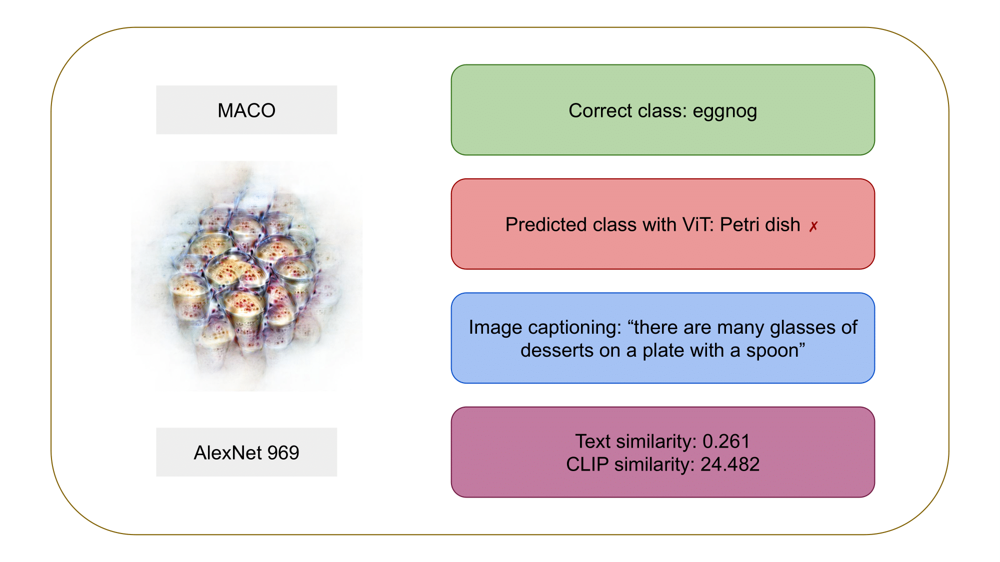

In [ ]:
import tqdm
import numpy as np
import timm
import seaborn as sns
import pandas as pd
import torch
import torchvision
import scipy
import matplotlib
import PIL
import transformers
import sentence_transformers

print("numpy:", np.__version__)
print("timm:", timm.__version__)
print("torch:", torch.__version__)
print("torchvision:", torchvision.__version__)
print("scipy:", scipy.__version__)
print("matplotlib:", matplotlib.__version__)
print("PIL:", PIL.__version__)
print("tqdm:", tqdm.__version__)
print("seaborn:", sns.__version__)
print("pandas:", pd.__version__)
print("transformers:", transformers.__version__)
print("sentence-transformers:", sentence_transformers.__version__)

numpy: 2.0.2
timm: 1.0.24
torch: 2.10.0+cu128
torchvision: 0.25.0+cu128
scipy: 1.16.3
matplotlib: 3.10.0
PIL: 11.3.0
tqdm: 4.67.3
seaborn: 0.13.2
pandas: 2.2.2
transformers: 5.0.0
sentence-transformers: 5.2.3


In [ ]:
# --- Core Python & Utils ---
import random
import numpy as np
import pandas as pd

# --- PyTorch & Optimization ---
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam
import torch.optim as optim

# --- Vision Models & Transforms ---
import timm
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image

# --- Statistics & Distributions ---
from scipy import stats
from scipy.stats import multivariate_normal

# --- Visualization ---
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

# --- NLP & Transformers ---
from transformers import (
    AutoProcessor,
    AutoModelForCausalLM,
    BlipProcessor,
    BlipForConditionalGeneration,
    CLIPProcessor,
    CLIPModel
)
from sentence_transformers import SentenceTransformer, util

Select the network to study, your path, and the id of a selected unit. The flag `randomize` refers to the application of the Output Layer Ablation Test (AM will not work, as it would be expected). unit = 130 refers to the class flamingo. In this case we are just interested on the last layer.

In [ ]:
#@title Configuration { form-width: "400px" }

#@markdown Set the working path, model selection, unit (layer index), and randomization option:

# Unit index (corresponds to the last layer neuron/channel)
unit = 130 #@param {type:"integer"}

# Model selection
model_id = "VGG16" #@param ["AlexNet","VGG16", "ResNet50", "ViT"]

# Randomization control
randomize = False #@param {type:"boolean"}

# Internal mapping for model identifiers
MODEL_OPTIONS = {
    "VGG16": "vgg16",
    "ResNet50": "resnet50",
    "AlexNet": "alexnet",
    "ViT": "vit_base_patch16_224"
}

model_id2 = MODEL_OPTIONS[model_id]

print(f"Unit index: {unit}")
print(f"Selected model: {model_id} ({model_id2})")
print(f"Randomize: {randomize}")

Unit index: 130
Selected model: VGG16 (vgg16)
Randomize: False


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
def set_size(w,h):
    plt.rcParams["figure.figsize"] = [w,h]

%config InlineBackend.figure_format = 'retina'

In [ ]:
if model_id == "vit":
    support_model = timm.create_model('resnet50', pretrained=True).cuda().eval()
    transform_support = timm.data.create_transform(
        **timm.data.resolve_data_config(support_model.pretrained_cfg)
    )
else:
    support_model = timm.create_model('vit_base_patch16_224', pretrained=True).cuda().eval()
    transform_support = timm.data.create_transform(
        **timm.data.resolve_data_config(support_model.pretrained_cfg)
    )

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

In [ ]:
if model_id == "AlexNet":
    def create_alexnet_transform():
        """
        Creates the standard preprocessing transform pipeline for AlexNet.

        AlexNet was trained on ImageNet with the following preprocessing:
        1. Resize to 256x256
        2. Center crop to 224x224
        3. Normalize with ImageNet mean and std
        4. Convert to tensor

        Returns:
            transforms.Compose: The preprocessing pipeline
        """
        return transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                              std=[0.229, 0.224, 0.225])
        ])

In [ ]:
if model_id == "AlexNet":
    studied_model = models.alexnet(pretrained=True).cuda().eval()
    transform_studied = create_alexnet_transform()
else:
    studied_model = timm.create_model(model_id2, pretrained=True).cuda().eval()
    transform_studied = timm.data.create_transform(
    **timm.data.resolve_data_config(studied_model.pretrained_cfg))

model.safetensors:   0%|          | 0.00/553M [00:00<?, ?B/s]

In [ ]:
# Get the last layer's weights
if model_id == "AlexNet":
    last_layer = studied_model.classifier[-1]
elif model_id == "vit":
    last_layer = studied_model.head
elif model_id == "ResNet50":
    last_layer = studied_model.fc
elif model_id == "VGG16":
    last_layer = studied_model.head.fc
else:
    raise ValueError("Invalid model_id")

weights = last_layer.weight.data

# Randomize the weights
if randomize:
    with torch.no_grad():
        # Use a uniform distribution to initialize the weights randomly
        new_weights = torch.rand_like(weights)
        last_layer.weight.copy_(new_weights)

In [ ]:
# Function to display the result
def display_result(image_tensor):
    """Convert tensor to PIL Image for display"""

    # Remove any gradient information and convert to CPU
    image = image_tensor.detach().cpu()

    # Convert to PIL Image
    to_pil = transforms.ToPILImage()
    image = to_pil(image.squeeze(0))

    return image

The following model is the captioner to measure $m_{TS}$.




In [ ]:
processor_i2t = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-large")
img2text_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-large")

img2text_model = img2text_model.to(device)

preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

The image processor of type `BlipImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/527 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

Loading weights:   0%|          | 0/616 [00:00<?, ?it/s]

The tied weights mapping and config for this model specifies to tie text_decoder.bert.embeddings.word_embeddings.weight to text_decoder.cls.predictions.decoder.weight, but both are present in the checkpoints, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning
BlipForConditionalGeneration LOAD REPORT from: Salesforce/blip-image-captioning-large
Key                                       | Status     |  | 
------------------------------------------+------------+--+-
text_decoder.bert.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


In [ ]:
def img2text(image):
    inputs = processor_i2t(images=image, return_tensors="pt").to(img2text_model.device)
    out = img2text_model.generate(**inputs)
    return processor_i2t.decode(out[0], skip_special_tokens=True)

The following Sentence Transformer is used to compute the similarity between the generated caption and the correct label.  

In [ ]:
sentence_model = SentenceTransformer('all-MiniLM-L6-v2')
sentence_model.to(device)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/103 [00:00<?, ?it/s]

BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

SentenceTransformer(
  (0): Transformer({'max_seq_length': 256, 'do_lower_case': False, 'architecture': 'BertModel'})
  (1): Pooling({'word_embedding_dimension': 384, 'pooling_mode_cls_token': False, 'pooling_mode_mean_tokens': True, 'pooling_mode_max_tokens': False, 'pooling_mode_mean_sqrt_len_tokens': False, 'pooling_mode_weightedmean_tokens': False, 'pooling_mode_lasttoken': False, 'include_prompt': True})
  (2): Normalize()
)

In [ ]:
def text_similarity(text1, text2):
    # Encode the texts
    embeddings1 = sentence_model.encode(text1, convert_to_tensor=True)
    embeddings2 = sentence_model.encode(text2, convert_to_tensor=True)
    # Compute cosine similarity
    similarity = util.pytorch_cos_sim(embeddings1, embeddings2)
    return similarity.item()

In [ ]:
def classify_image(model, image_tensor):
    """Classifies the given image tensor using the provided model."""
    model.eval()
    with torch.no_grad():
        output = model(image_tensor)
        probabilities = torch.nn.functional.softmax(output[0], dim=0)
        predicted_class = torch.argmax(probabilities).item()
        confidence = probabilities[predicted_class].item()
    return predicted_class, confidence

In [ ]:
def evaluate_model(model, image, target_neuron, device='cuda'):
    activations = model(image)
    target_activation = activations[0, target_neuron]
    softmax_score = F.softmax(activations, dim=1)[0, target_neuron].item()
    return target_activation.item(), softmax_score

CLIP models are used to compute the similarity between the generated image and the correct label.

In [ ]:
if model_id == "vit":
    clip = CLIPModel.from_pretrained("openai/clip-vit-large-patch14-336")
    clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-large-patch14-336")
else:
    clip = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
    clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

The image processor of type `CLIPImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [ ]:
def CLIP_score(image, text):
    inputs = clip_processor(text=text, images=image, return_tensors="pt", padding=True)

    with torch.no_grad():
        outputs = clip(**inputs)
        score = outputs.logits_per_image  # this is the image-text similarity score

    score = score.detach().cpu().numpy()[0][0]
    return score

### Classes

Don't expand. Not necessary (Imagenet classes)

In [ ]:
imagenet_classes =  {0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma maculatum',
 29: 'axolotl, mud puppy, Ambystoma mexicanum',
 30: 'bullfrog, Rana catesbeiana',
 31: 'tree frog, tree-frog',
 32: 'tailed frog, bell toad, ribbed toad, tailed toad, Ascaphus trui',
 33: 'loggerhead, loggerhead turtle, Caretta caretta',
 34: 'leatherback turtle, leatherback, leathery turtle, Dermochelys coriacea',
 35: 'mud turtle',
 36: 'terrapin',
 37: 'box turtle, box tortoise',
 38: 'banded gecko',
 39: 'common iguana, iguana, Iguana iguana',
 40: 'American chameleon, anole, Anolis carolinensis',
 41: 'whiptail, whiptail lizard',
 42: 'agama',
 43: 'frilled lizard, Chlamydosaurus kingi',
 44: 'alligator lizard',
 45: 'Gila monster, Heloderma suspectum',
 46: 'green lizard, Lacerta viridis',
 47: 'African chameleon, Chamaeleo chamaeleon',
 48: 'Komodo dragon, Komodo lizard, dragon lizard, giant lizard, Varanus komodoensis',
 49: 'African crocodile, Nile crocodile, Crocodylus niloticus',
 50: 'American alligator, Alligator mississipiensis',
 51: 'triceratops',
 52: 'thunder snake, worm snake, Carphophis amoenus',
 53: 'ringneck snake, ring-necked snake, ring snake',
 54: 'hognose snake, puff adder, sand viper',
 55: 'green snake, grass snake',
 56: 'king snake, kingsnake',
 57: 'garter snake, grass snake',
 58: 'water snake',
 59: 'vine snake',
 60: 'night snake, Hypsiglena torquata',
 61: 'boa constrictor, Constrictor constrictor',
 62: 'rock python, rock snake, Python sebae',
 63: 'Indian cobra, Naja naja',
 64: 'green mamba',
 65: 'sea snake',
 66: 'horned viper, cerastes, sand viper, horned asp, Cerastes cornutus',
 67: 'diamondback, diamondback rattlesnake, Crotalus adamanteus',
 68: 'sidewinder, horned rattlesnake, Crotalus cerastes',
 69: 'trilobite',
 70: 'harvestman, daddy longlegs, Phalangium opilio',
 71: 'scorpion',
 72: 'black and gold garden spider, Argiope aurantia',
 73: 'barn spider, Araneus cavaticus',
 74: 'garden spider, Aranea diademata',
 75: 'black widow, Latrodectus mactans',
 76: 'tarantula',
 77: 'wolf spider, hunting spider',
 78: 'tick',
 79: 'centipede',
 80: 'black grouse',
 81: 'ptarmigan',
 82: 'ruffed grouse, partridge, Bonasa umbellus',
 83: 'prairie chicken, prairie grouse, prairie fowl',
 84: 'peacock',
 85: 'quail',
 86: 'partridge',
 87: 'African grey, African gray, Psittacus erithacus',
 88: 'macaw',
 89: 'sulphur-crested cockatoo, Kakatoe galerita, Cacatua galerita',
 90: 'lorikeet',
 91: 'coucal',
 92: 'bee eater',
 93: 'hornbill',
 94: 'hummingbird',
 95: 'jacamar',
 96: 'toucan',
 97: 'drake',
 98: 'red-breasted merganser, Mergus serrator',
 99: 'goose',
 100: 'black swan, Cygnus atratus',
 101: 'tusker',
 102: 'echidna, spiny anteater, anteater',
 103: 'platypus, duckbill, duckbilled platypus, duck-billed platypus, Ornithorhynchus anatinus',
 104: 'wallaby, brush kangaroo',
 105: 'koala, koala bear, kangaroo bear, native bear, Phascolarctos cinereus',
 106: 'wombat',
 107: 'jellyfish',
 108: 'sea anemone, anemone',
 109: 'brain coral',
 110: 'flatworm, platyhelminth',
 111: 'nematode, nematode worm, roundworm',
 112: 'conch',
 113: 'snail',
 114: 'slug',
 115: 'sea slug, nudibranch',
 116: 'chiton, coat-of-mail shell, sea cradle, polyplacophore',
 117: 'chambered nautilus, pearly nautilus, nautilus',
 118: 'Dungeness crab, Cancer magister',
 119: 'rock crab, Cancer irroratus',
 120: 'fiddler crab',
 121: 'king crab, Alaska crab, Alaskan king crab, Alaska king crab, Paralithodes camtschatica',
 122: 'American lobster, Northern lobster, Maine lobster, Homarus americanus',
 123: 'spiny lobster, langouste, rock lobster, crawfish, crayfish, sea crawfish',
 124: 'crayfish, crawfish, crawdad, crawdaddy',
 125: 'hermit crab',
 126: 'isopod',
 127: 'white stork, Ciconia ciconia',
 128: 'black stork, Ciconia nigra',
 129: 'spoonbill',
 130: 'flamingo',
 131: 'little blue heron, Egretta caerulea',
 132: 'American egret, great white heron, Egretta albus',
 133: 'bittern',
 134: 'crane',
 135: 'limpkin, Aramus pictus',
 136: 'European gallinule, Porphyrio porphyrio',
 137: 'American coot, marsh hen, mud hen, water hen, Fulica americana',
 138: 'bustard',
 139: 'ruddy turnstone, Arenaria interpres',
 140: 'red-backed sandpiper, dunlin, Erolia alpina',
 141: 'redshank, Tringa totanus',
 142: 'dowitcher',
 143: 'oystercatcher, oyster catcher',
 144: 'pelican',
 145: 'king penguin, Aptenodytes patagonica',
 146: 'albatross, mollymawk',
 147: 'grey whale, gray whale, devilfish, Eschrichtius gibbosus, Eschrichtius robustus',
 148: 'killer whale, killer, orca, grampus, sea wolf, Orcinus orca',
 149: 'dugong, Dugong dugon',
 150: 'sea lion',
 151: 'Chihuahua',
 152: 'Japanese spaniel',
 153: 'Maltese dog, Maltese terrier, Maltese',
 154: 'Pekinese, Pekingese, Peke',
 155: 'Shih-Tzu',
 156: 'Blenheim spaniel',
 157: 'papillon',
 158: 'toy terrier',
 159: 'Rhodesian ridgeback',
 160: 'Afghan hound, Afghan',
 161: 'basset, basset hound',
 162: 'beagle',
 163: 'bloodhound, sleuthhound',
 164: 'bluetick',
 165: 'black-and-tan coonhound',
 166: 'Walker hound, Walker foxhound',
 167: 'English foxhound',
 168: 'redbone',
 169: 'borzoi, Russian wolfhound',
 170: 'Irish wolfhound',
 171: 'Italian greyhound',
 172: 'whippet',
 173: 'Ibizan hound, Ibizan Podenco',
 174: 'Norwegian elkhound, elkhound',
 175: 'otterhound, otter hound',
 176: 'Saluki, gazelle hound',
 177: 'Scottish deerhound, deerhound',
 178: 'Weimaraner',
 179: 'Staffordshire bullterrier, Staffordshire bull terrier',
 180: 'American Staffordshire terrier, Staffordshire terrier, American pit bull terrier, pit bull terrier',
 181: 'Bedlington terrier',
 182: 'Border terrier',
 183: 'Kerry blue terrier',
 184: 'Irish terrier',
 185: 'Norfolk terrier',
 186: 'Norwich terrier',
 187: 'Yorkshire terrier',
 188: 'wire-haired fox terrier',
 189: 'Lakeland terrier',
 190: 'Sealyham terrier, Sealyham',
 191: 'Airedale, Airedale terrier',
 192: 'cairn, cairn terrier',
 193: 'Australian terrier',
 194: 'Dandie Dinmont, Dandie Dinmont terrier',
 195: 'Boston bull, Boston terrier',
 196: 'miniature schnauzer',
 197: 'giant schnauzer',
 198: 'standard schnauzer',
 199: 'Scotch terrier, Scottish terrier, Scottie',
 200: 'Tibetan terrier, chrysanthemum dog',
 201: 'silky terrier, Sydney silky',
 202: 'soft-coated wheaten terrier',
 203: 'West Highland white terrier',
 204: 'Lhasa, Lhasa apso',
 205: 'flat-coated retriever',
 206: 'curly-coated retriever',
 207: 'golden retriever',
 208: 'Labrador retriever',
 209: 'Chesapeake Bay retriever',
 210: 'German short-haired pointer',
 211: 'vizsla, Hungarian pointer',
 212: 'English setter',
 213: 'Irish setter, red setter',
 214: 'Gordon setter',
 215: 'Brittany spaniel',
 216: 'clumber, clumber spaniel',
 217: 'English springer, English springer spaniel',
 218: 'Welsh springer spaniel',
 219: 'cocker spaniel, English cocker spaniel, cocker',
 220: 'Sussex spaniel',
 221: 'Irish water spaniel',
 222: 'kuvasz',
 223: 'schipperke',
 224: 'groenendael',
 225: 'malinois',
 226: 'briard',
 227: 'kelpie',
 228: 'komondor',
 229: 'Old English sheepdog, bobtail',
 230: 'Shetland sheepdog, Shetland sheep dog, Shetland',
 231: 'collie',
 232: 'Border collie',
 233: 'Bouvier des Flandres, Bouviers des Flandres',
 234: 'Rottweiler',
 235: 'German shepherd, German shepherd dog, German police dog, alsatian',
 236: 'Doberman, Doberman pinscher',
 237: 'miniature pinscher',
 238: 'Greater Swiss Mountain dog',
 239: 'Bernese mountain dog',
 240: 'Appenzeller',
 241: 'EntleBucher',
 242: 'boxer',
 243: 'bull mastiff',
 244: 'Tibetan mastiff',
 245: 'French bulldog',
 246: 'Great Dane',
 247: 'Saint Bernard, St Bernard',
 248: 'Eskimo dog, husky',
 249: 'malamute, malemute, Alaskan malamute',
 250: 'Siberian husky',
 251: 'dalmatian, coach dog, carriage dog',
 252: 'affenpinscher, monkey pinscher, monkey dog',
 253: 'basenji',
 254: 'pug, pug-dog',
 255: 'Leonberg',
 256: 'Newfoundland, Newfoundland dog',
 257: 'Great Pyrenees',
 258: 'Samoyed, Samoyede',
 259: 'Pomeranian',
 260: 'chow, chow chow',
 261: 'keeshond',
 262: 'Brabancon griffon',
 263: 'Pembroke, Pembroke Welsh corgi',
 264: 'Cardigan, Cardigan Welsh corgi',
 265: 'toy poodle',
 266: 'miniature poodle',
 267: 'standard poodle',
 268: 'Mexican hairless',
 269: 'timber wolf, grey wolf, gray wolf, Canis lupus',
 270: 'white wolf, Arctic wolf, Canis lupus tundrarum',
 271: 'red wolf, maned wolf, Canis rufus, Canis niger',
 272: 'coyote, prairie wolf, brush wolf, Canis latrans',
 273: 'dingo, warrigal, warragal, Canis dingo',
 274: 'dhole, Cuon alpinus',
 275: 'African hunting dog, hyena dog, Cape hunting dog, Lycaon pictus',
 276: 'hyena, hyaena',
 277: 'red fox, Vulpes vulpes',
 278: 'kit fox, Vulpes macrotis',
 279: 'Arctic fox, white fox, Alopex lagopus',
 280: 'grey fox, gray fox, Urocyon cinereoargenteus',
 281: 'tabby, tabby cat',
 282: 'tiger cat',
 283: 'Persian cat',
 284: 'Siamese cat, Siamese',
 285: 'Egyptian cat',
 286: 'cougar, puma, catamount, mountain lion, painter, panther, Felis concolor',
 287: 'lynx, catamount',
 288: 'leopard, Panthera pardus',
 289: 'snow leopard, ounce, Panthera uncia',
 290: 'jaguar, panther, Panthera onca, Felis onca',
 291: 'lion, king of beasts, Panthera leo',
 292: 'tiger, Panthera tigris',
 293: 'cheetah, chetah, Acinonyx jubatus',
 294: 'brown bear, bruin, Ursus arctos',
 295: 'American black bear, black bear, Ursus americanus, Euarctos americanus',
 296: 'ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus',
 297: 'sloth bear, Melursus ursinus, Ursus ursinus',
 298: 'mongoose',
 299: 'meerkat, mierkat',
 300: 'tiger beetle',
 301: 'ladybug, ladybeetle, lady beetle, ladybird, ladybird beetle',
 302: 'ground beetle, carabid beetle',
 303: 'long-horned beetle, longicorn, longicorn beetle',
 304: 'leaf beetle, chrysomelid',
 305: 'dung beetle',
 306: 'rhinoceros beetle',
 307: 'weevil',
 308: 'fly',
 309: 'bee',
 310: 'ant, emmet, pismire',
 311: 'grasshopper, hopper',
 312: 'cricket',
 313: 'walking stick, walkingstick, stick insect',
 314: 'cockroach, roach',
 315: 'mantis, mantid',
 316: 'cicada, cicala',
 317: 'leafhopper',
 318: 'lacewing, lacewing fly',
 319: "dragonfly, darning needle, devil's darning needle, sewing needle, snake feeder, snake doctor, mosquito hawk, skeeter hawk",
 320: 'damselfly',
 321: 'admiral',
 322: 'ringlet, ringlet butterfly',
 323: 'monarch, monarch butterfly, milkweed butterfly, Danaus plexippus',
 324: 'cabbage butterfly',
 325: 'sulphur butterfly, sulfur butterfly',
 326: 'lycaenid, lycaenid butterfly',
 327: 'starfish, sea star',
 328: 'sea urchin',
 329: 'sea cucumber, holothurian',
 330: 'wood rabbit, cottontail, cottontail rabbit',
 331: 'hare',
 332: 'Angora, Angora rabbit',
 333: 'hamster',
 334: 'porcupine, hedgehog',
 335: 'fox squirrel, eastern fox squirrel, Sciurus niger',
 336: 'marmot',
 337: 'beaver',
 338: 'guinea pig, Cavia cobaya',
 339: 'sorrel',
 340: 'zebra',
 341: 'hog, pig, grunter, squealer, Sus scrofa',
 342: 'wild boar, boar, Sus scrofa',
 343: 'warthog',
 344: 'hippopotamus, hippo, river horse, Hippopotamus amphibius',
 345: 'ox',
 346: 'water buffalo, water ox, Asiatic buffalo, Bubalus bubalis',
 347: 'bison',
 348: 'ram, tup',
 349: 'bighorn, bighorn sheep, cimarron, Rocky Mountain bighorn, Rocky Mountain sheep, Ovis canadensis',
 350: 'ibex, Capra ibex',
 351: 'hartebeest',
 352: 'impala, Aepyceros melampus',
 353: 'gazelle',
 354: 'Arabian camel, dromedary, Camelus dromedarius',
 355: 'llama',
 356: 'weasel',
 357: 'mink',
 358: 'polecat, fitch, foulmart, foumart, Mustela putorius',
 359: 'black-footed ferret, ferret, Mustela nigripes',
 360: 'otter',
 361: 'skunk, polecat, wood pussy',
 362: 'badger',
 363: 'armadillo',
 364: 'three-toed sloth, ai, Bradypus tridactylus',
 365: 'orangutan, orang, orangutang, Pongo pygmaeus',
 366: 'gorilla, Gorilla gorilla',
 367: 'chimpanzee, chimp, Pan troglodytes',
 368: 'gibbon, Hylobates lar',
 369: 'siamang, Hylobates syndactylus, Symphalangus syndactylus',
 370: 'guenon, guenon monkey',
 371: 'patas, hussar monkey, Erythrocebus patas',
 372: 'baboon',
 373: 'macaque',
 374: 'langur',
 375: 'colobus, colobus monkey',
 376: 'proboscis monkey, Nasalis larvatus',
 377: 'marmoset',
 378: 'capuchin, ringtail, Cebus capucinus',
 379: 'howler monkey, howler',
 380: 'titi, titi monkey',
 381: 'spider monkey, Ateles geoffroyi',
 382: 'squirrel monkey, Saimiri sciureus',
 383: 'Madagascar cat, ring-tailed lemur, Lemur catta',
 384: 'indri, indris, Indri indri, Indri brevicaudatus',
 385: 'Indian elephant, Elephas maximus',
 386: 'African elephant, Loxodonta africana',
 387: 'lesser panda, red panda, panda, bear cat, cat bear, Ailurus fulgens',
 388: 'giant panda, panda, panda bear, coon bear, Ailuropoda melanoleuca',
 389: 'barracouta, snoek',
 390: 'eel',
 391: 'coho, cohoe, coho salmon, blue jack, silver salmon, Oncorhynchus kisutch',
 392: 'rock beauty, Holocanthus tricolor',
 393: 'anemone fish',
 394: 'sturgeon',
 395: 'gar, garfish, garpike, billfish, Lepisosteus osseus',
 396: 'lionfish',
 397: 'puffer, pufferfish, blowfish, globefish',
 398: 'abacus',
 399: 'abaya',
 400: "academic gown, academic robe, judge's robe",
 401: 'accordion, piano accordion, squeeze box',
 402: 'acoustic guitar',
 403: 'aircraft carrier, carrier, flattop, attack aircraft carrier',
 404: 'airliner',
 405: 'airship, dirigible',
 406: 'altar',
 407: 'ambulance',
 408: 'amphibian, amphibious vehicle',
 409: 'analog clock',
 410: 'apiary, bee house',
 411: 'apron',
 412: 'ashcan, trash can, garbage can, wastebin, ash bin, ash-bin, ashbin, dustbin, trash barrel, trash bin',
 413: 'assault rifle, assault gun',
 414: 'backpack, back pack, knapsack, packsack, rucksack, haversack',
 415: 'bakery, bakeshop, bakehouse',
 416: 'balance beam, beam',
 417: 'balloon',
 418: 'ballpoint, ballpoint pen, ballpen, Biro',
 419: 'Band Aid',
 420: 'banjo',
 421: 'bannister, banister, balustrade, balusters, handrail',
 422: 'barbell',
 423: 'barber chair',
 424: 'barbershop',
 425: 'barn',
 426: 'barometer',
 427: 'barrel, cask',
 428: 'barrow, garden cart, lawn cart, wheelbarrow',
 429: 'baseball',
 430: 'basketball',
 431: 'bassinet',
 432: 'bassoon',
 433: 'bathing cap, swimming cap',
 434: 'bath towel',
 435: 'bathtub, bathing tub, bath, tub',
 436: 'beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon',
 437: 'beacon, lighthouse, beacon light, pharos',
 438: 'beaker',
 439: 'bearskin, busby, shako',
 440: 'beer bottle',
 441: 'beer glass',
 442: 'bell cote, bell cot',
 443: 'bib',
 444: 'bicycle-built-for-two, tandem bicycle, tandem',
 445: 'bikini, two-piece',
 446: 'binder, ring-binder',
 447: 'binoculars, field glasses, opera glasses',
 448: 'birdhouse',
 449: 'boathouse',
 450: 'bobsled, bobsleigh, bob',
 451: 'bolo tie, bolo, bola tie, bola',
 452: 'bonnet, poke bonnet',
 453: 'bookcase',
 454: 'bookshop, bookstore, bookstall',
 455: 'bottlecap',
 456: 'bow',
 457: 'bow tie, bow-tie, bowtie',
 458: 'brass, memorial tablet, plaque',
 459: 'brassiere, bra, bandeau',
 460: 'breakwater, groin, groyne, mole, bulwark, seawall, jetty',
 461: 'breastplate, aegis, egis',
 462: 'broom',
 463: 'bucket, pail',
 464: 'buckle',
 465: 'bulletproof vest',
 466: 'bullet train, bullet',
 467: 'butcher shop, meat market',
 468: 'cab, hack, taxi, taxicab',
 469: 'caldron, cauldron',
 470: 'candle, taper, wax light',
 471: 'cannon',
 472: 'canoe',
 473: 'can opener, tin opener',
 474: 'cardigan',
 475: 'car mirror',
 476: 'carousel, carrousel, merry-go-round, roundabout, whirligig',
 477: "carpenter's kit, tool kit",
 478: 'carton',
 479: 'car wheel',
 480: 'cash machine, cash dispenser, automated teller machine, automatic teller machine, automated teller, automatic teller, ATM',
 481: 'cassette',
 482: 'cassette player',
 483: 'castle',
 484: 'catamaran',
 485: 'CD player',
 486: 'cello, violoncello',
 487: 'cellular telephone, cellular phone, cellphone, cell, mobile phone',
 488: 'chain',
 489: 'chainlink fence',
 490: 'chain mail, ring mail, mail, chain armor, chain armour, ring armor, ring armour',
 491: 'chain saw, chainsaw',
 492: 'chest',
 493: 'chiffonier, commode',
 494: 'chime, bell, gong',
 495: 'china cabinet, china closet',
 496: 'Christmas stocking',
 497: 'church, church building',
 498: 'cinema, movie theater, movie theatre, movie house, picture palace',
 499: 'cleaver, meat cleaver, chopper',
 500: 'cliff dwelling',
 501: 'cloak',
 502: 'clog, geta, patten, sabot',
 503: 'cocktail shaker',
 504: 'coffee mug',
 505: 'coffeepot',
 506: 'coil, spiral, volute, whorl, helix',
 507: 'combination lock',
 508: 'computer keyboard, keypad',
 509: 'confectionery, confectionary, candy store',
 510: 'container ship, containership, container vessel',
 511: 'convertible',
 512: 'corkscrew, bottle screw',
 513: 'cornet, horn, trumpet, trump',
 514: 'cowboy boot',
 515: 'cowboy hat, ten-gallon hat',
 516: 'cradle',
 517: 'crane',
 518: 'crash helmet',
 519: 'crate',
 520: 'crib, cot',
 521: 'Crock Pot',
 522: 'croquet ball',
 523: 'crutch',
 524: 'cuirass',
 525: 'dam, dike, dyke',
 526: 'desk',
 527: 'desktop computer',
 528: 'dial telephone, dial phone',
 529: 'diaper, nappy, napkin',
 530: 'digital clock',
 531: 'digital watch',
 532: 'dining table, board',
 533: 'dishrag, dishcloth',
 534: 'dishwasher, dish washer, dishwashing machine',
 535: 'disk brake, disc brake',
 536: 'dock, dockage, docking facility',
 537: 'dogsled, dog sled, dog sleigh',
 538: 'dome',
 539: 'doormat, welcome mat',
 540: 'drilling platform, offshore rig',
 541: 'drum, membranophone, tympan',
 542: 'drumstick',
 543: 'dumbbell',
 544: 'Dutch oven',
 545: 'electric fan, blower',
 546: 'electric guitar',
 547: 'electric locomotive',
 548: 'entertainment center',
 549: 'envelope',
 550: 'espresso maker',
 551: 'face powder',
 552: 'feather boa, boa',
 553: 'file, file cabinet, filing cabinet',
 554: 'fireboat',
 555: 'fire engine, fire truck',
 556: 'fire screen, fireguard',
 557: 'flagpole, flagstaff',
 558: 'flute, transverse flute',
 559: 'folding chair',
 560: 'football helmet',
 561: 'forklift',
 562: 'fountain',
 563: 'fountain pen',
 564: 'four-poster',
 565: 'freight car',
 566: 'French horn, horn',
 567: 'frying pan, frypan, skillet',
 568: 'fur coat',
 569: 'garbage truck, dustcart',
 570: 'gasmask, respirator, gas helmet',
 571: 'gas pump, gasoline pump, petrol pump, island dispenser',
 572: 'goblet',
 573: 'go-kart',
 574: 'golf ball',
 575: 'golfcart, golf cart',
 576: 'gondola',
 577: 'gong, tam-tam',
 578: 'gown',
 579: 'grand piano, grand',
 580: 'greenhouse, nursery, glasshouse',
 581: 'grille, radiator grille',
 582: 'grocery store, grocery, food market, market',
 583: 'guillotine',
 584: 'hair slide',
 585: 'hair spray',
 586: 'half track',
 587: 'hammer',
 588: 'hamper',
 589: 'hand blower, blow dryer, blow drier, hair dryer, hair drier',
 590: 'hand-held computer, hand-held microcomputer',
 591: 'handkerchief, hankie, hanky, hankey',
 592: 'hard disc, hard disk, fixed disk',
 593: 'harmonica, mouth organ, harp, mouth harp',
 594: 'harp',
 595: 'harvester, reaper',
 596: 'hatchet',
 597: 'holster',
 598: 'home theater, home theatre',
 599: 'honeycomb',
 600: 'hook, claw',
 601: 'hoopskirt, crinoline',
 602: 'horizontal bar, high bar',
 603: 'horse cart, horse-cart',
 604: 'hourglass',
 605: 'iPod',
 606: 'iron, smoothing iron',
 607: "jack-o'-lantern",
 608: 'jean, blue jean, denim',
 609: 'jeep, landrover',
 610: 'jersey, T-shirt, tee shirt',
 611: 'jigsaw puzzle',
 612: 'jinrikisha, ricksha, rickshaw',
 613: 'joystick',
 614: 'kimono',
 615: 'knee pad',
 616: 'knot',
 617: 'lab coat, laboratory coat',
 618: 'ladle',
 619: 'lampshade, lamp shade',
 620: 'laptop, laptop computer',
 621: 'lawn mower, mower',
 622: 'lens cap, lens cover',
 623: 'letter opener, paper knife, paperknife',
 624: 'library',
 625: 'lifeboat',
 626: 'lighter, light, igniter, ignitor',
 627: 'limousine, limo',
 628: 'liner, ocean liner',
 629: 'lipstick, lip rouge',
 630: 'Loafer',
 631: 'lotion',
 632: 'loudspeaker, speaker, speaker unit, loudspeaker system, speaker system',
 633: "loupe, jeweler's loupe",
 634: 'lumbermill, sawmill',
 635: 'magnetic compass',
 636: 'mailbag, postbag',
 637: 'mailbox, letter box',
 638: 'maillot',
 639: 'maillot, tank suit',
 640: 'manhole cover',
 641: 'maraca',
 642: 'marimba, xylophone',
 643: 'mask',
 644: 'matchstick',
 645: 'maypole',
 646: 'maze, labyrinth',
 647: 'measuring cup',
 648: 'medicine chest, medicine cabinet',
 649: 'megalith, megalithic structure',
 650: 'microphone, mike',
 651: 'microwave, microwave oven',
 652: 'military uniform',
 653: 'milk can',
 654: 'minibus',
 655: 'miniskirt, mini',
 656: 'minivan',
 657: 'missile',
 658: 'mitten',
 659: 'mixing bowl',
 660: 'mobile home, manufactured home',
 661: 'Model T',
 662: 'modem',
 663: 'monastery',
 664: 'monitor',
 665: 'moped',
 666: 'mortar',
 667: 'mortarboard',
 668: 'mosque',
 669: 'mosquito net',
 670: 'motor scooter, scooter',
 671: 'mountain bike, all-terrain bike, off-roader',
 672: 'mountain tent',
 673: 'mouse, computer mouse',
 674: 'mousetrap',
 675: 'moving van',
 676: 'muzzle',
 677: 'nail',
 678: 'neck brace',
 679: 'necklace',
 680: 'nipple',
 681: 'notebook, notebook computer',
 682: 'obelisk',
 683: 'oboe, hautboy, hautbois',
 684: 'ocarina, sweet potato',
 685: 'odometer, hodometer, mileometer, milometer',
 686: 'oil filter',
 687: 'organ, pipe organ',
 688: 'oscilloscope, scope, cathode-ray oscilloscope, CRO',
 689: 'overskirt',
 690: 'oxcart',
 691: 'oxygen mask',
 692: 'packet',
 693: 'paddle, boat paddle',
 694: 'paddlewheel, paddle wheel',
 695: 'padlock',
 696: 'paintbrush',
 697: "pajama, pyjama, pj's, jammies",
 698: 'palace',
 699: 'panpipe, pandean pipe, syrinx',
 700: 'paper towel',
 701: 'parachute, chute',
 702: 'parallel bars, bars',
 703: 'park bench',
 704: 'parking meter',
 705: 'passenger car, coach, carriage',
 706: 'patio, terrace',
 707: 'pay-phone, pay-station',
 708: 'pedestal, plinth, footstall',
 709: 'pencil box, pencil case',
 710: 'pencil sharpener',
 711: 'perfume, essence',
 712: 'Petri dish',
 713: 'photocopier',
 714: 'pick, plectrum, plectron',
 715: 'pickelhaube',
 716: 'picket fence, paling',
 717: 'pickup, pickup truck',
 718: 'pier',
 719: 'piggy bank, penny bank',
 720: 'pill bottle',
 721: 'pillow',
 722: 'ping-pong ball',
 723: 'pinwheel',
 724: 'pirate, pirate ship',
 725: 'pitcher, ewer',
 726: "plane, carpenter's plane, woodworking plane",
 727: 'planetarium',
 728: 'plastic bag',
 729: 'plate rack',
 730: 'plow, plough',
 731: "plunger, plumber's helper",
 732: 'Polaroid camera, Polaroid Land camera',
 733: 'pole',
 734: 'police van, police wagon, paddy wagon, patrol wagon, wagon, black Maria',
 735: 'poncho',
 736: 'pool table, billiard table, snooker table',
 737: 'pop bottle, soda bottle',
 738: 'pot, flowerpot',
 739: "potter's wheel",
 740: 'power drill',
 741: 'prayer rug, prayer mat',
 742: 'printer',
 743: 'prison, prison house',
 744: 'projectile, missile',
 745: 'projector',
 746: 'puck, hockey puck',
 747: 'punching bag, punch bag, punching ball, punchball',
 748: 'purse',
 749: 'quill, quill pen',
 750: 'quilt, comforter, comfort, puff',
 751: 'racer, race car, racing car',
 752: 'racket, racquet',
 753: 'radiator',
 754: 'radio, wireless',
 755: 'radio telescope, radio reflector',
 756: 'rain barrel',
 757: 'recreational vehicle, RV, R.V.',
 758: 'reel',
 759: 'reflex camera',
 760: 'refrigerator, icebox',
 761: 'remote control, remote',
 762: 'restaurant, eating house, eating place, eatery',
 763: 'revolver, six-gun, six-shooter',
 764: 'rifle',
 765: 'rocking chair, rocker',
 766: 'rotisserie',
 767: 'rubber eraser, rubber, pencil eraser',
 768: 'rugby ball',
 769: 'rule, ruler',
 770: 'running shoe',
 771: 'safe',
 772: 'safety pin',
 773: 'saltshaker, salt shaker',
 774: 'sandal',
 775: 'sarong',
 776: 'sax, saxophone',
 777: 'scabbard',
 778: 'scale, weighing machine',
 779: 'school bus',
 780: 'schooner',
 781: 'scoreboard',
 782: 'screen, CRT screen',
 783: 'screw',
 784: 'screwdriver',
 785: 'seat belt, seatbelt',
 786: 'sewing machine',
 787: 'shield, buckler',
 788: 'shoe shop, shoe-shop, shoe store',
 789: 'shoji',
 790: 'shopping basket',
 791: 'shopping cart',
 792: 'shovel',
 793: 'shower cap',
 794: 'shower curtain',
 795: 'ski',
 796: 'ski mask',
 797: 'sleeping bag',
 798: 'slide rule, slipstick',
 799: 'sliding door',
 800: 'slot, one-armed bandit',
 801: 'snorkel',
 802: 'snowmobile',
 803: 'snowplow, snowplough',
 804: 'soap dispenser',
 805: 'soccer ball',
 806: 'sock',
 807: 'solar dish, solar collector, solar furnace',
 808: 'sombrero',
 809: 'soup bowl',
 810: 'space bar',
 811: 'space heater',
 812: 'space shuttle',
 813: 'spatula',
 814: 'speedboat',
 815: "spider web, spider's web",
 816: 'spindle',
 817: 'sports car, sport car',
 818: 'spotlight, spot',
 819: 'stage',
 820: 'steam locomotive',
 821: 'steel arch bridge',
 822: 'steel drum',
 823: 'stethoscope',
 824: 'stole',
 825: 'stone wall',
 826: 'stopwatch, stop watch',
 827: 'stove',
 828: 'strainer',
 829: 'streetcar, tram, tramcar, trolley, trolley car',
 830: 'stretcher',
 831: 'studio couch, day bed',
 832: 'stupa, tope',
 833: 'submarine, pigboat, sub, U-boat',
 834: 'suit, suit of clothes',
 835: 'sundial',
 836: 'sunglass',
 837: 'sunglasses, dark glasses, shades',
 838: 'sunscreen, sunblock, sun blocker',
 839: 'suspension bridge',
 840: 'swab, swob, mop',
 841: 'sweatshirt',
 842: 'swimming trunks, bathing trunks',
 843: 'swing',
 844: 'switch, electric switch, electrical switch',
 845: 'syringe',
 846: 'table lamp',
 847: 'tank, army tank, armored combat vehicle, armoured combat vehicle',
 848: 'tape player',
 849: 'teapot',
 850: 'teddy, teddy bear',
 851: 'television, television system',
 852: 'tennis ball',
 853: 'thatch, thatched roof',
 854: 'theater curtain, theatre curtain',
 855: 'thimble',
 856: 'thresher, thrasher, threshing machine',
 857: 'throne',
 858: 'tile roof',
 859: 'toaster',
 860: 'tobacco shop, tobacconist shop, tobacconist',
 861: 'toilet seat',
 862: 'torch',
 863: 'totem pole',
 864: 'tow truck, tow car, wrecker',
 865: 'toyshop',
 866: 'tractor',
 867: 'trailer truck, tractor trailer, trucking rig, rig, articulated lorry, semi',
 868: 'tray',
 869: 'trench coat',
 870: 'tricycle, trike, velocipede',
 871: 'trimaran',
 872: 'tripod',
 873: 'triumphal arch',
 874: 'trolleybus, trolley coach, trackless trolley',
 875: 'trombone',
 876: 'tub, vat',
 877: 'turnstile',
 878: 'typewriter keyboard',
 879: 'umbrella',
 880: 'unicycle, monocycle',
 881: 'upright, upright piano',
 882: 'vacuum, vacuum cleaner',
 883: 'vase',
 884: 'vault',
 885: 'velvet',
 886: 'vending machine',
 887: 'vestment',
 888: 'viaduct',
 889: 'violin, fiddle',
 890: 'volleyball',
 891: 'waffle iron',
 892: 'wall clock',
 893: 'wallet, billfold, notecase, pocketbook',
 894: 'wardrobe, closet, press',
 895: 'warplane, military plane',
 896: 'washbasin, handbasin, washbowl, lavabo, wash-hand basin',
 897: 'washer, automatic washer, washing machine',
 898: 'water bottle',
 899: 'water jug',
 900: 'water tower',
 901: 'whiskey jug',
 902: 'whistle',
 903: 'wig',
 904: 'window screen',
 905: 'window shade',
 906: 'Windsor tie',
 907: 'wine bottle',
 908: 'wing',
 909: 'wok',
 910: 'wooden spoon',
 911: 'wool, woolen, woollen',
 912: 'worm fence, snake fence, snake-rail fence, Virginia fence',
 913: 'wreck',
 914: 'yawl',
 915: 'yurt',
 916: 'web site, website, internet site, site',
 917: 'comic book',
 918: 'crossword puzzle, crossword',
 919: 'street sign',
 920: 'traffic light, traffic signal, stoplight',
 921: 'book jacket, dust cover, dust jacket, dust wrapper',
 922: 'menu',
 923: 'plate',
 924: 'guacamole',
 925: 'consomme',
 926: 'hot pot, hotpot',
 927: 'trifle',
 928: 'ice cream, icecream',
 929: 'ice lolly, lolly, lollipop, popsicle',
 930: 'French loaf',
 931: 'bagel, beigel',
 932: 'pretzel',
 933: 'cheeseburger',
 934: 'hotdog, hot dog, red hot',
 935: 'mashed potato',
 936: 'head cabbage',
 937: 'broccoli',
 938: 'cauliflower',
 939: 'zucchini, courgette',
 940: 'spaghetti squash',
 941: 'acorn squash',
 942: 'butternut squash',
 943: 'cucumber, cuke',
 944: 'artichoke, globe artichoke',
 945: 'bell pepper',
 946: 'cardoon',
 947: 'mushroom',
 948: 'Granny Smith',
 949: 'strawberry',
 950: 'orange',
 951: 'lemon',
 952: 'fig',
 953: 'pineapple, ananas',
 954: 'banana',
 955: 'jackfruit, jak, jack',
 956: 'custard apple',
 957: 'pomegranate',
 958: 'hay',
 959: 'carbonara',
 960: 'chocolate sauce, chocolate syrup',
 961: 'dough',
 962: 'meat loaf, meatloaf',
 963: 'pizza, pizza pie',
 964: 'potpie',
 965: 'burrito',
 966: 'red wine',
 967: 'espresso',
 968: 'cup',
 969: 'eggnog',
 970: 'alp',
 971: 'bubble',
 972: 'cliff, drop, drop-off',
 973: 'coral reef',
 974: 'geyser',
 975: 'lakeside, lakeshore',
 976: 'promontory, headland, head, foreland',
 977: 'sandbar, sand bar',
 978: 'seashore, coast, seacoast, sea-coast',
 979: 'valley, vale',
 980: 'volcano',
 981: 'ballplayer, baseball player',
 982: 'groom, bridegroom',
 983: 'scuba diver',
 984: 'rapeseed',
 985: 'daisy',
 986: "yellow lady's slipper, yellow lady-slipper, Cypripedium calceolus, Cypripedium parviflorum",
 987: 'corn',
 988: 'acorn',
 989: 'hip, rose hip, rosehip',
 990: 'buckeye, horse chestnut, conker',
 991: 'coral fungus',
 992: 'agaric',
 993: 'gyromitra',
 994: 'stinkhorn, carrion fungus',
 995: 'earthstar',
 996: 'hen-of-the-woods, hen of the woods, Polyporus frondosus, Grifola frondosa',
 997: 'bolete',
 998: 'ear, spike, capitulum',
 999: 'toilet tissue, toilet paper, bathroom tissue'}

## Random generation

Random generation as a baseline. The following code produces a randomly generated image. It should not work.

In [ ]:
def activation_maximization_random(
    model,
    target_neuron,
    normalize = True,
    device='cuda',
    display = True
):
    """
    Random Activation Maximization
    """
    # Random noise (smaller initialization)


    input_image = torch.nn.Parameter(
        torch.randn(1, 3, 224, 224, device=device) * 0.01
    )

    if normalize:
        with torch.no_grad():
            input_image = (input_image - input_image.min()) / (input_image.max() - input_image.min())

    if display:
        activations = model(input_image)
        target_activation = activations[0, target_neuron]
        softmax_score = F.softmax(activations, dim=1)[0, target_neuron].item()

    return input_image

Let's generate a random image.

In [ ]:
result = activation_maximization_random(
    studied_model,
    unit,
    normalize=True
)

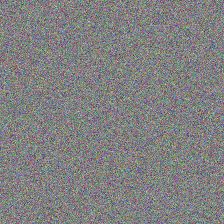

In [ ]:
# Display result
image = display_result(result)
image

It should be something like this:

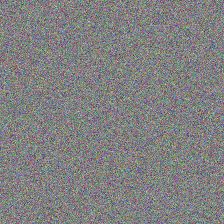

This is suppose to be a flamingo!

In [ ]:
imagenet_classes[unit]

'flamingo'

Here we can apply image captioning. This is the *linguistic explanation* of the image.

In [ ]:
img2text(image)

'arafed image of a television screen with a small amount of color'

In [ ]:
text_similarity(imagenet_classes[unit],img2text(image))

0.10839848220348358

Class prediction in this case would be completelly random.

In [ ]:
predicted_class, _ = classify_image(support_model, result)
imagenet_classes[predicted_class]

'kite'

Finally we can also use the CLIP score to measure the quality of the explanation.

In [ ]:
CLIP_score(image, imagenet_classes[unit])

np.float32(20.83614)

It is possible to run the entire evaluation using the following scheme.

In [ ]:
A_attacked = []
S_attacked = []
A_defense  = []
S_defense = []

TS = []
CS = []
Acc = 0

iters = 1000 # 1000

for i in tqdm(range(iters)):
    result = activation_maximization_random(
        studied_model,
        i,
        normalize=True,
        display=False
    )
    attacked_result = evaluate_model(studied_model, result, i)
    defense_result = evaluate_model(support_model, result, i)
    A_attacked.append(attacked_result[0])
    S_attacked.append(attacked_result[1])
    A_defense.append(defense_result[0])
    S_defense.append(defense_result[1])

    predicted_class, _ = classify_image(support_model, result)

    if predicted_class == i:
        Acc += 1


    image = display_result(result)

    TS.append(text_similarity( imagenet_classes[i] , img2text(image)))
    CS.append(CLIP_score(image, imagenet_classes[i]))

Acc = Acc/iters

100%|██████████| 1000/1000 [07:28<00:00,  2.23it/s]


Finally we can retrieve the basic metrics.

In [ ]:
print("Transferability accuracy \t=",Acc)
print("Text similarity \t\t=",sum(TS)/len(TS))
print("CLIP score \t\t\t=",sum(CS)/len(CS))

Transferability accuracy 	= 0.001
Text similarity 		= 0.08076170370308683
CLIP score 			= 20.968176


## Szegedy, et al., 2013

This is intented to be used as an adversarial approach since it does not provide regularization. However, in some cases, it provides some indication about the ground truth semantics.


In [ ]:
def activation_maximization_szegedy(
    model,
    target_neuron,
    iterations=500,
    learning_rate=0.1,
    normalize = True,
    device='cuda',
    display = True
):
    """
    Activation Maximization following Szegedy et al. 2013
    """
    # Initialize with scaled random noise (smaller initialization)
    input_image = torch.nn.Parameter(
        torch.randn(1, 3, 224, 224, device=device) * 0.01
    )


    # Optimizer with momentum (as used in the paper)
    optimizer = Adam([input_image], lr=learning_rate)

    # Set model to eval mode
    model.eval()

    best_loss = float('inf')
    best_image = None

    for i in range(iterations):
        optimizer.zero_grad()

        # Forward pass
        activations = model(input_image)
        target_activation = activations[0, target_neuron]

        # Loss (negative because we want to maximize)
        loss = -target_activation

        # Backward pass
        loss.backward()
        optimizer.step()

        # Print progress
        if i % 50 == 0:
            softmax_score = F.softmax(activations, dim=1)[0, target_neuron].item()
            if display:
                print(f"Iteration {i}")
                print(f"Raw Activation: {target_activation.item():.4f}")
                print(f"Softmax Score: {softmax_score:.4f}")
                print("______________________")

    # Normalize to [0,1] range for visualization
    if normalize:
        with torch.no_grad():
            input_image = (input_image - input_image.min()) / (input_image.max() - input_image.min())

    if display:
        activations = model(input_image)
        target_activation = activations[0, target_neuron]
        softmax_score = F.softmax(activations, dim=1)[0, target_neuron].item()
        print(f"Raw Activation: {target_activation.item():.4f}")
        print(f"Softmax Score: {softmax_score:.4f}")
        print("______________________")

    return input_image

In [ ]:
result = activation_maximization_szegedy(
    studied_model,
    unit,
    iterations=100,
    learning_rate=0.1,
    normalize=True
)

Iteration 0
Raw Activation: 0.3063
Softmax Score: 0.0008
______________________
Iteration 50
Raw Activation: 1633.6624
Softmax Score: 1.0000
______________________
Raw Activation: 201.4584
Softmax Score: 1.0000
______________________


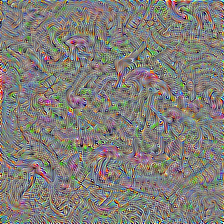

In [ ]:
# Display result
image = display_result(result)
image

It should be like this:

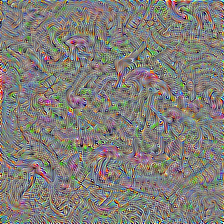

In [ ]:
predicted_class, _ = classify_image(support_model, result)
print("Predicted class : ",imagenet_classes[predicted_class])
print("Linguistic explanation : ",img2text(image))
print("Text similarity : ", text_similarity(imagenet_classes[unit], img2text(image)))
print("CLIP score : ", CLIP_score(image,imagenet_classes[unit]))

Predicted class :  brain coral
Linguistic explanation :  a close up of a colorful pattern with many different colors
Text similarity :  0.18752796947956085
CLIP score :  23.94009


## Simonyan *et al*, 2015

The work of Simonyan *et al* (2015) provides a basic regularization process.

In [ ]:
def activation_maximization_simonyan(
    model,
    target_neuron,
    iterations=500,
    learning_rate=0.1,
    l2_weight=1e-3,
    normalize = True,
    device='cuda',
    display = True
):
    """
    Activation Maximization following Simonyan et al. 2015
    """
    # Initialize with scaled random noise (smaller initialization)
    input_image = torch.nn.Parameter(
        torch.randn(1, 3, 224, 224, device=device) * 0.01
    )


    # Optimizer with momentum (as used in the paper)
    optimizer = Adam([input_image], lr=learning_rate)

    # Set model to eval mode
    model.eval()


    for i in range(iterations):
        optimizer.zero_grad()

        # Forward pass
        activations = model(input_image)
        target_activation = activations[0, target_neuron]

        # L2 regularization
        l2_reg = torch.sum(torch.square(input_image))

        # Loss (negative because we want to maximize)
        loss = -target_activation + l2_weight * l2_reg

        # Backward pass
        loss.backward()
        optimizer.step()

        # Print progress
        if i % 50 == 0:
            softmax_score = F.softmax(activations, dim=1)[0, target_neuron].item()
            if display:
                print(f"Iteration {i}")
                print(f"Raw Activation: {target_activation.item():.4f}")
                print(f"Softmax Score: {softmax_score:.4f}")
                print(f"Loss: {loss.item():.4f}")
                print("______________________")

    # Normalize to [0,1] range for visualization
    if normalize:
        with torch.no_grad():
            input_image = (input_image - input_image.min()) / (input_image.max() - input_image.min())

    if display:
        activations = model(input_image)
        target_activation = activations[0, target_neuron]
        softmax_score = F.softmax(activations, dim=1)[0, target_neuron].item()
        print(f"Raw Activation: {target_activation.item():.4f}")
        print(f"Softmax Score: {softmax_score:.4f}")
        print("______________________")

    return input_image

In [ ]:
result = activation_maximization_simonyan(
    studied_model,
    unit,
    iterations=100,
    learning_rate=0.1,
    l2_weight=1e-1
)

Iteration 0
Raw Activation: 0.3334
Softmax Score: 0.0008
Loss: 1.1701
______________________
Iteration 50
Raw Activation: 602.4317
Softmax Score: 1.0000
Loss: -293.3808
______________________
Raw Activation: 199.9910
Softmax Score: 1.0000
______________________


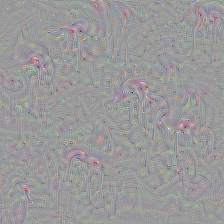

In [ ]:
# Display result
image = display_result(result)
image

It should be like this:

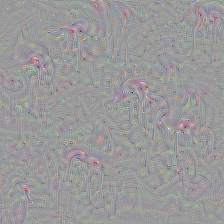

In [ ]:
predicted_class, _ = classify_image(support_model, result)
print("Predicted class : ",imagenet_classes[predicted_class])
print("Linguistic explanation : ",img2text(image))
print("Text similarity : ", text_similarity(imagenet_classes[unit], img2text(image)))
print("CLIP score : ", CLIP_score(image,imagenet_classes[unit]))

Predicted class :  nematode, nematode worm, roundworm
Linguistic explanation :  araffes of flamingos in a field of grass with a sky background
Text similarity :  0.4950028955936432
CLIP score :  20.907856


## Yosinski *et al*, 2015

In [ ]:
from typing import Optional, Callable, Tuple

In [ ]:
class activation_maximization_yosinski:
    def __init__(
        self,
        model: nn.Module,
        unit_index: int,
        input_size: Tuple[int, int] = (224, 224),
        device: str = "cuda" if torch.cuda.is_available() else "cpu"
    ):
        """
        Initialize Activation Maximization.

        Args:
            model: timm model
            unit_index: index of the unit to maximize in the last layer
            input_size: size of input image
            device: device to run optimization on
        """
        self.model = model.to(device)
        self.model.eval()
        self.unit_index = unit_index
        self.input_size = input_size
        self.device = device

        # Register hook to get activations of the last layer
        self.activation = None

    def _get_activation(self, x: torch.Tensor) -> torch.Tensor:
        """Get activation of target unit."""
        self.activation = self.model(x)
        return self.activation[:, self.unit_index].mean()

    def l2_decay(self, x: torch.Tensor, theta_decay: float) -> torch.Tensor:
        """Apply L2 decay regularization."""
        return (1 - theta_decay) * x

    def gaussian_blur(self, x: torch.Tensor, theta_b_width: int) -> torch.Tensor:
        """Apply Gaussian blur regularization."""
        channels = x.size(1)
        blur = transforms.GaussianBlur(kernel_size=theta_b_width)
        return blur(x)

    def clip_small_norm(self, x: torch.Tensor, theta_n_pct: float) -> torch.Tensor:
        """Clip pixels with small norm."""
        norms = torch.norm(x, p=2, dim=1)
        threshold = torch.quantile(norms.flatten(), theta_n_pct)
        mask = (norms > threshold).unsqueeze(1)
        return x * mask

    def clip_small_contrib(self, x: torch.Tensor, theta_c_pct: float) -> torch.Tensor:
        """Clip pixels with small contribution."""
        x.requires_grad_(True)
        activation = self._get_activation(x)
        grad = torch.autograd.grad(activation, x)[0]

        contribution = torch.abs(torch.sum(x * grad, dim=1))
        threshold = torch.quantile(contribution.flatten(), theta_c_pct)
        mask = (contribution > threshold).unsqueeze(1)
        x.requires_grad_(False)
        return x * mask

    def optimize(
        self,
        num_iterations: int = 100,
        learning_rate: float = 0.1,
        regularization: str = 'l2',
        theta_decay: float = 0.01,
        theta_b_width: int = 3,
        theta_b_every: int = 4,  # Apply blur every n steps
        theta_n_pct: float = 0.1,
        theta_c_pct: float = 0.1,
        random_seed: Optional[int] = None
    ) -> torch.Tensor:
        """
        Perform activation maximization optimization.

        Args:
            num_iterations: number of optimization iterations
            learning_rate: learning rate for gradient ascent
            regularization: type of regularization ('l2', 'blur', 'norm', 'contrib')
            theta_decay: decay factor for L2 regularization
            theta_b_width: kernel size for Gaussian blur
            theta_b_every: apply blur every n iterations (for 'blur' regularization)
            theta_n_pct: percentile threshold for norm clipping
            theta_c_pct: percentile threshold for contribution clipping
            random_seed: random seed for reproducibility

        Returns:
            Optimized input image
        """
        if random_seed is not None:
            torch.manual_seed(random_seed)

        # Initialize random image
        x = torch.randn(1, 3, *self.input_size, requires_grad=True, device=self.device)

        # Optimization loop
        for i in range(num_iterations):
            # Forward pass and compute gradient
            activation = self._get_activation(x)
            grad = torch.autograd.grad(activation, x)[0]

            # Gradient ascent step
            with torch.no_grad():
                x += learning_rate * grad

                # Apply regularization
                if regularization == 'l2':
                    x = self.l2_decay(x, theta_decay)
                elif regularization == 'blur':
                    # Apply blur every theta_b_every steps
                    if i % theta_b_every == 0:
                        x = self.gaussian_blur(x, theta_b_width)
                elif regularization == 'norm':
                    x = self.clip_small_norm(x, theta_n_pct)
                elif regularization == 'contrib':
                    x = self.clip_small_contrib(x, theta_c_pct)
                elif regularization == "all":
                    x = self.l2_decay(x, theta_decay)
                    if i % theta_b_every == 0:
                        x = self.gaussian_blur(x, theta_b_width)
                    x = self.clip_small_norm(x, theta_n_pct)
                    x = self.clip_small_contrib(x, theta_c_pct)
                else:
                    raise ValueError(f"Unknown regularization: {regularization}")

                # Ensure x requires grad for next iteration
                x.requires_grad_()

        with torch.no_grad():
            x = (x - x.min()) / (x.max() - x.min() )

        return x

In [ ]:
am = activation_maximization_yosinski(
    model=studied_model,
    unit_index=unit,
    input_size=(224, 224))

In [ ]:
result = am.optimize(
            num_iterations=100,
            learning_rate=0.1,
            regularization='blur',
            theta_b_every= 4,
            theta_b_width= 3,
            random_seed=42)

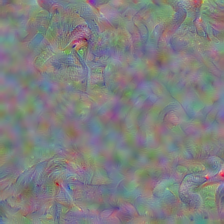

In [ ]:
image = display_result(result)
image

It should be something like this:

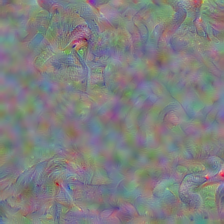

In [ ]:
predicted_class, _ = classify_image(support_model, result)
print("Predicted class : ",imagenet_classes[predicted_class])
print("Linguistic explanation : ",img2text(image))
print("Text similarity : ", text_similarity(imagenet_classes[unit], img2text(image)))
print("CLIP score : ", CLIP_score(image,imagenet_classes[unit]))

Predicted class :  nematode, nematode worm, roundworm
Linguistic explanation :  a close up of a group of birds in a field
Text similarity :  0.25629958510398865
CLIP score :  23.751263


## Mordvintsev, et al., 2015

In [ ]:
class JitterLayer(nn.Module):
    """
    Implements the jitter operation described in the Inceptionism paper.
    Jitter helps reduce high-frequency artifacts and acts as a regularizer.
    """
    def __init__(self, max_jitter):
        super(JitterLayer, self).__init__()
        self.max_jitter = max_jitter

    def forward(self, x):
        batch, channels, height, width = x.shape

        # Generate random jitter offsets
        h_jitter = np.random.randint(-self.max_jitter, self.max_jitter + 1)
        w_jitter = np.random.randint(-self.max_jitter, self.max_jitter + 1)

        # Pad the input to handle jitter
        pad_h = abs(h_jitter)
        pad_w = abs(w_jitter)
        x_padded = F.pad(x, (pad_w, pad_w, pad_h, pad_h), mode='reflect')

        # Apply jitter by selecting the shifted window
        h_start = pad_h + h_jitter
        w_start = pad_w + w_jitter
        x_jittered = x_padded[:, :,
                             h_start:h_start + height,
                             w_start:w_start + width]

        return x_jittered

In [ ]:
class JitterLayer(nn.Module):
    """
    Implements the jitter operation described in the Inceptionism paper.
    Jitter helps reduce high-frequency artifacts and acts as a regularizer.
    """
    def __init__(self, max_jitter):
        super(JitterLayer, self).__init__()
        self.max_jitter = max_jitter

    def forward(self, x):
        batch, channels, height, width = x.shape

        # Generate random jitter offsets
        h_jitter = np.random.randint(-self.max_jitter, self.max_jitter + 1)
        w_jitter = np.random.randint(-self.max_jitter, self.max_jitter + 1)

        # Pad the input to handle jitter
        pad_h = abs(h_jitter)
        pad_w = abs(w_jitter)
        x_padded = F.pad(x, (pad_w, pad_w, pad_h, pad_h), mode='reflect')

        # Apply jitter by selecting the shifted window
        h_start = pad_h + h_jitter
        w_start = pad_w + w_jitter
        x_jittered = x_padded[:, :,
                             h_start:h_start + height,
                             w_start:w_start + width]

        return x_jittered

class ActivationMaximizationJitter:
    def __init__(self, model, target_class,
                 learning_rate=1.0, max_jitter=8, num_scales=3,display = True):
        self.device = next(model.parameters()).device  # Get the device of the model
        self.model = model
        self.target_class = target_class
        self.learning_rate = learning_rate
        self.jitter = JitterLayer(max_jitter).to(self.device)
        self.num_scales = num_scales
        self.display = display

    def preprocess_image(self, image):
        """Apply standard preprocessing (normalize to [-1, 1])"""
        return (image - 0.5) * 2.0

    def deprocess_image(self, image):
        """Convert back to [0, 1] range"""
        return (image / 2.0) + 0.5

    def create_multi_scale_pyramid(self, image):
        """Create image pyramid for multi-scale processing"""
        pyramid = []
        for i in range(self.num_scales):
            scale = 1.0 / (2 ** i)
            scaled_image = F.interpolate(image,
                                       scale_factor=scale,
                                       mode='bilinear',
                                       align_corners=True)
            pyramid.append(scaled_image)
        return pyramid

    def optimize(self, num_iterations=500, initial_image=None):
        """
        Perform activation maximization with jitter and multi-scale processing
        """
        # Initialize with random noise if no initial image provided
        if initial_image is None:
            initial_image = torch.randn(1, 3, 224, 224, requires_grad=True, device=self.device)
        else:
            initial_image = initial_image.clone().detach().to(self.device).requires_grad_(True)

        optimizer = torch.optim.Adam([initial_image], lr=self.learning_rate)

        for i in range(num_iterations):
            optimizer.zero_grad()

            # Apply jitter
            jittered_image = self.jitter(initial_image)

            # Create and process multi-scale pyramid
            pyramid = self.create_multi_scale_pyramid(jittered_image)
            total_loss = 0

            for scaled_image in pyramid:
                # Forward pass
                self.model.zero_grad()
                activation = self.model(self.preprocess_image(scaled_image))

                # Calculate loss (negative because we want to maximize activation)
                loss = -activation[0, self.target_class].mean()
                total_loss += loss

            # Backward pass
            total_loss.backward()
            optimizer.step()

            # Clip values to valid image range
            with torch.no_grad():
                initial_image.clamp_(0, 1)

            if (i + 1) % 50 == 0 and self.display:
                print(f'Iteration {i+1}/{num_iterations}, Loss: {total_loss.item():.4f}')

        return self.deprocess_image(initial_image)

In [ ]:
class ActivationMaximizationJitter:
    def __init__(self, model, target_class,
                 learning_rate=1.0, max_jitter=8, num_scales=3,display = True):
        self.device = next(model.parameters()).device  # Get the device of the model
        self.model = model
        self.target_class = target_class
        self.learning_rate = learning_rate
        self.jitter = JitterLayer(max_jitter).to(self.device)
        self.num_scales = num_scales
        self.display = display

    def preprocess_image(self, image):
        """Apply standard preprocessing (normalize to [-1, 1])"""
        return (image - 0.5) * 2.0

    def deprocess_image(self, image):
        """Convert back to [0, 1] range"""
        return (image / 2.0) + 0.5

    def create_multi_scale_pyramid(self, image):
        """Create image pyramid for multi-scale processing"""
        pyramid = []
        for i in range(self.num_scales):
            scale = 1.0 / (2 ** i)
            scaled_image = F.interpolate(image,
                                       scale_factor=scale,
                                       mode='bilinear',
                                       align_corners=True)
            pyramid.append(scaled_image)
        return pyramid

    def optimize(self, num_iterations=500, initial_image=None):
        """
        Perform activation maximization with jitter and multi-scale processing
        """
        # Initialize with random noise if no initial image provided
        if initial_image is None:
            initial_image = torch.randn(1, 3, 224, 224, requires_grad=True, device=self.device)
        else:
            initial_image = initial_image.clone().detach().to(self.device).requires_grad_(True)

        optimizer = torch.optim.Adam([initial_image], lr=self.learning_rate)

        for i in range(num_iterations):
            optimizer.zero_grad()

            # Apply jitter
            jittered_image = self.jitter(initial_image)

            # Create and process multi-scale pyramid
            pyramid = self.create_multi_scale_pyramid(jittered_image)
            total_loss = 0

            for scaled_image in pyramid:
                # Forward pass
                self.model.zero_grad()
                activation = self.model(self.preprocess_image(scaled_image))

                # Calculate loss (negative because we want to maximize activation)
                loss = -activation[0, self.target_class].mean()
                total_loss += loss

            # Backward pass
            total_loss.backward()
            optimizer.step()

            # Clip values to valid image range
            with torch.no_grad():
                initial_image.clamp_(0, 1)

            if (i + 1) % 50 == 0 and self.display:
                print(f'Iteration {i+1}/{num_iterations}, Loss: {total_loss.item():.4f}')

        return self.deprocess_image(initial_image)

In [ ]:
if model_id == "vit":
    class ActivationMaximizationJitter:
        def __init__(self, model, target_class,
                    learning_rate=1.0, max_jitter=8, num_scales=3, display=True):
            self.device = next(model.parameters()).device
            self.model = model
            self.target_class = target_class
            self.learning_rate = learning_rate
            self.jitter = JitterLayer(max_jitter).to(self.device)
            self.num_scales = num_scales
            self.display = display
            self.img_size = model.patch_embed.img_size[0] if isinstance(model.patch_embed.img_size, (tuple, list)) else model.patch_embed.img_size

        def preprocess_image(self, image):
            """Apply standard preprocessing (normalize to [-1, 1])"""
            return (image - 0.5) * 2.0

        def deprocess_image(self, image):
            """Convert back to [0, 1] range"""
            return (image / 2.0) + 0.5

        def process_scale(self, image):
            """Process a single scale image through the model"""
            # Ensure the image is at the correct size for the model
            if image.shape[-2:] != (self.img_size, self.img_size):
                image = F.interpolate(image,
                                    size=(self.img_size, self.img_size),
                                    mode='bilinear',
                                    align_corners=True)

            # Preprocess and forward pass
            processed = self.preprocess_image(image)
            activation = self.model(processed)
            return activation

        def optimize(self, num_iterations=500, initial_image=None):
            """
            Perform activation maximization with jitter and multi-scale processing
            """
            # Initialize with random noise if no initial image provided
            if initial_image is None:
                initial_image = torch.randn(1, 3, self.img_size, self.img_size,
                                          requires_grad=True, device=self.device)
            else:
                # Resize initial image if needed
                if initial_image.shape[-2:] != (self.img_size, self.img_size):
                    initial_image = F.interpolate(initial_image,
                                              size=(self.img_size, self.img_size),
                                              mode='bilinear',
                                              align_corners=True)
                initial_image = initial_image.clone().detach().to(self.device).requires_grad_(True)

            optimizer = torch.optim.Adam([initial_image], lr=self.learning_rate)

            for i in range(num_iterations):
                optimizer.zero_grad()

                # Apply jitter
                jittered_image = self.jitter(initial_image)
                total_loss = 0

                # Process the original scale
                activation = self.process_scale(jittered_image)
                loss = -activation[0, self.target_class].mean()
                total_loss += loss

                # Process additional scales if num_scales > 1
                if self.num_scales > 1:
                    current_image = jittered_image
                    for scale in range(1, self.num_scales):
                        # Downsample
                        scaled_size = self.img_size // (2 ** scale)
                        if scaled_size < 32:  # Skip if too small
                            continue

                        downsampled = F.interpolate(current_image,
                                                  size=(scaled_size, scaled_size),
                                                  mode='bilinear',
                                                  align_corners=True)

                        # Process downsampled image
                        activation = self.process_scale(downsampled)
                        loss = -activation[0, self.target_class].mean()
                        total_loss += loss

                # Backward pass
                total_loss.backward()
                optimizer.step()

                # Clip values to valid image range
                with torch.no_grad():
                    initial_image.clamp_(0, 1)

                if (i + 1) % 50 == 0 and self.display:
                    print("______________________")
                    print(f'Iteration {i+1}/{num_iterations}, Loss: {total_loss.item():.4f}')

            return self.deprocess_image(initial_image)

In [ ]:
if model_id == "AlexNet":
    num_scales = 2
else:
    num_scales = 3

am = ActivationMaximizationJitter(
        model=studied_model,
        target_class=unit,
        learning_rate=0.1,
        max_jitter=8,
        num_scales=num_scales
    )

In [ ]:
result = am.optimize(num_iterations=100)

Iteration 50/100, Loss: -352.7649
Iteration 100/100, Loss: -785.2767


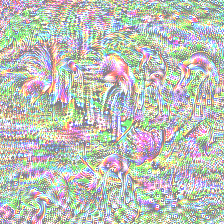

In [ ]:
image = display_result(result)
image

It should be something like this:

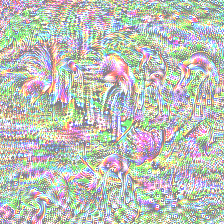

In [ ]:
predicted_class, _ = classify_image(support_model, result)
print("Predicted class : ",imagenet_classes[predicted_class])
print("Linguistic explanation : ",img2text(image))
print("Text similarity : ", text_similarity(imagenet_classes[unit], img2text(image)))
print("CLIP score : ", CLIP_score(image,imagenet_classes[unit]))

Predicted class :  peacock
Linguistic explanation :  a close up of a group of flamingos in a field
Text similarity :  0.6455354690551758
CLIP score :  28.124954


## Final proposals

MACO (Fel *et al.*, 2023) corresponds one of the last proposals for AM. In this implementation, the authors reimplemented the idea of Olah (2017, referred as "Fourier").

**CAUTION**: Images can **elicit** trypophobia.

In [ ]:
!pip install --no-dependencies horama timm

In [ ]:
from horama import maco, fourier, plot_maco
from horama.plots import show
import os

In [ ]:
def crop_center(image: Image.Image, crop_percentage: float) -> Image.Image:
    """
    Crops the center of a PIL image by a given percentage.

    Args:
        image: The input PIL image.
        crop_percentage: The percentage to crop from each side (0.0 to 1.0).

    Returns:
        The center-cropped PIL image.
    """

    width, height = image.size
    crop_width = int(width * crop_percentage)
    crop_height = int(height * crop_percentage)

    left = (width - crop_width) // 2
    top = (height - crop_height) // 2
    right = (width + crop_width) // 2
    bottom = (height + crop_height) // 2

    return image.crop((left, top, right, bottom))

### Olah *et al* (2017)

In [ ]:
objective = lambda images: torch.mean(studied_model(images)[:, unit])

In [ ]:
image2, alpha2 = fourier(objective, values_range=(-2.5, 2.5))

100%|██████████| 1000/1000 [01:14<00:00, 13.37it/s]


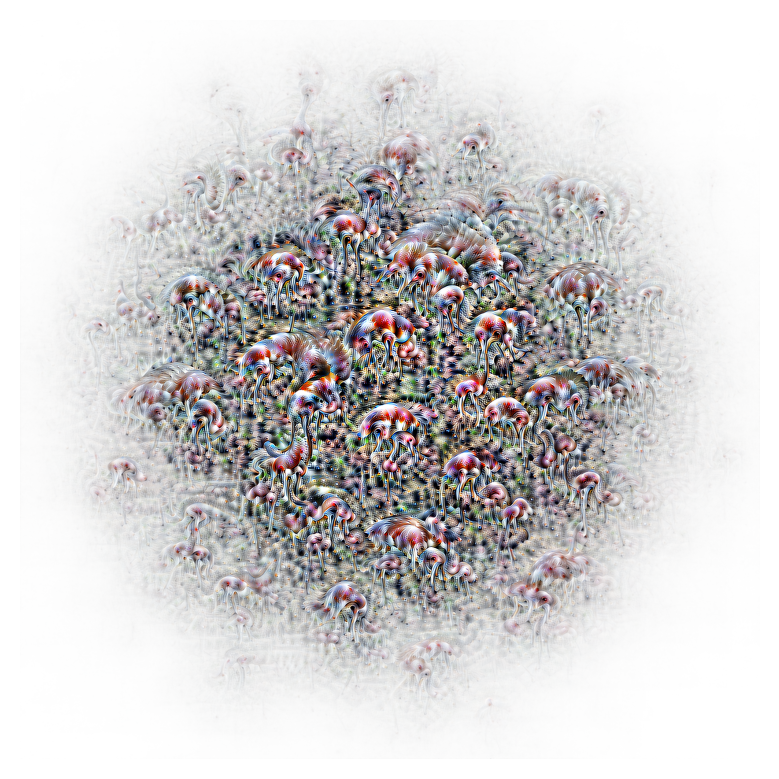

In [ ]:
plot_maco(image2,alpha2)
plt.savefig("fourier.png", dpi=300)
plt.show()

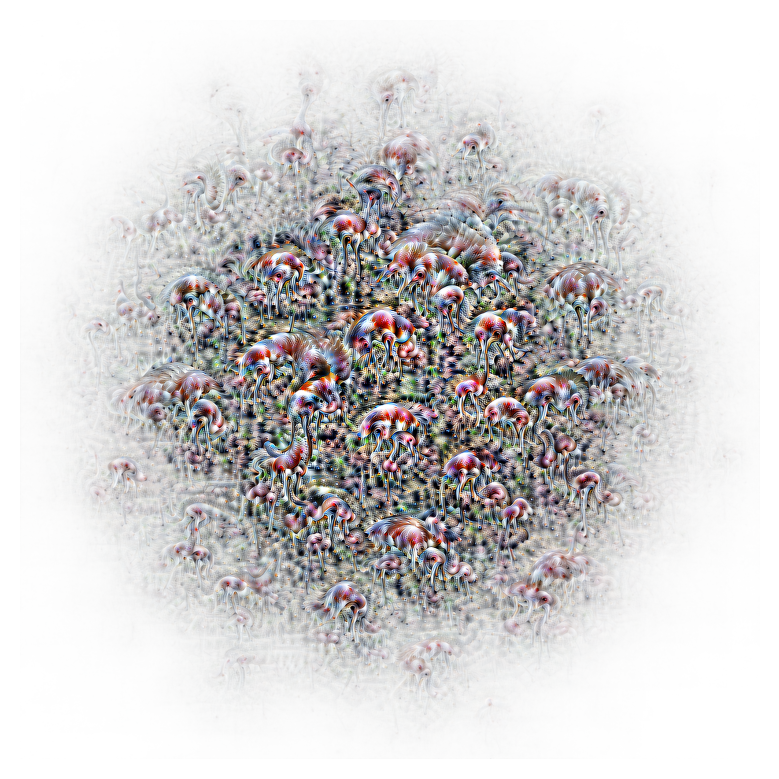

It should be something like this:

For better results, we need to crop the image.

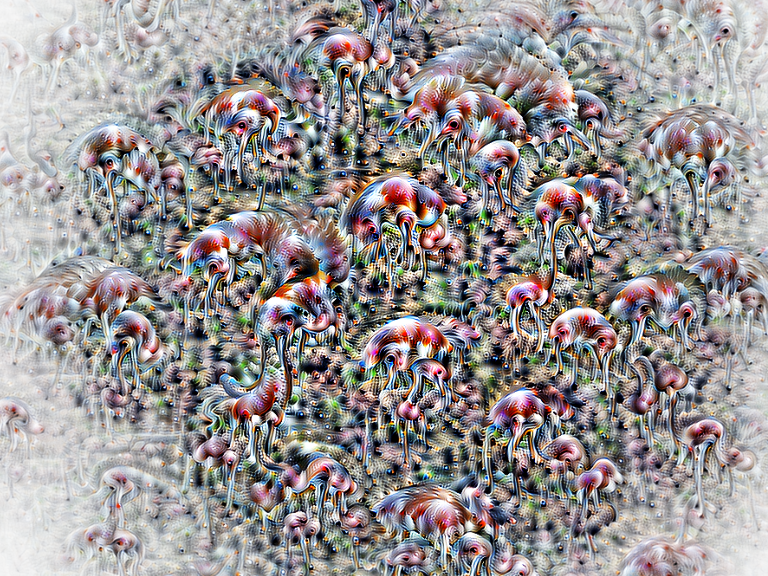

In [ ]:
img2 = Image.open("fourier.png")
img2 = crop_center(img2, 0.4)
img2

In [ ]:
img2 = img2.convert('RGB')

img2_d = transform_support(img2)
img2_d = img2_d.to(device)

out2_d = support_model(img2_d.unsqueeze(0))
out2_d = out2_d.cpu()

prob2_d = torch.nn.functional.softmax(out2_d[0], dim=0)
pred_2 = torch.argmax(prob2_d)

print("Predicted class : ",imagenet_classes[pred_2.item()])
print("Linguistic explanation : ",img2text(img2))
print("Text similarity : ", text_similarity(imagenet_classes[unit], img2text(img2)))
print("CLIP score : ", CLIP_score(img2,imagenet_classes[unit]))

Predicted class :  sea anemone, anemone
Linguistic explanation :  there are many birds that are standing together in the grass
Text similarity :  0.1701507717370987
CLIP score :  27.018612


### MACO (2023)

In [ ]:
image1, alpha1 = maco(objective, values_range=(-1, 1),model_input_size=224)

100%|██████████| 1.58M/1.58M [00:00<00:00, 195MB/s]
100%|██████████| 1000/1000 [01:12<00:00, 13.72it/s]


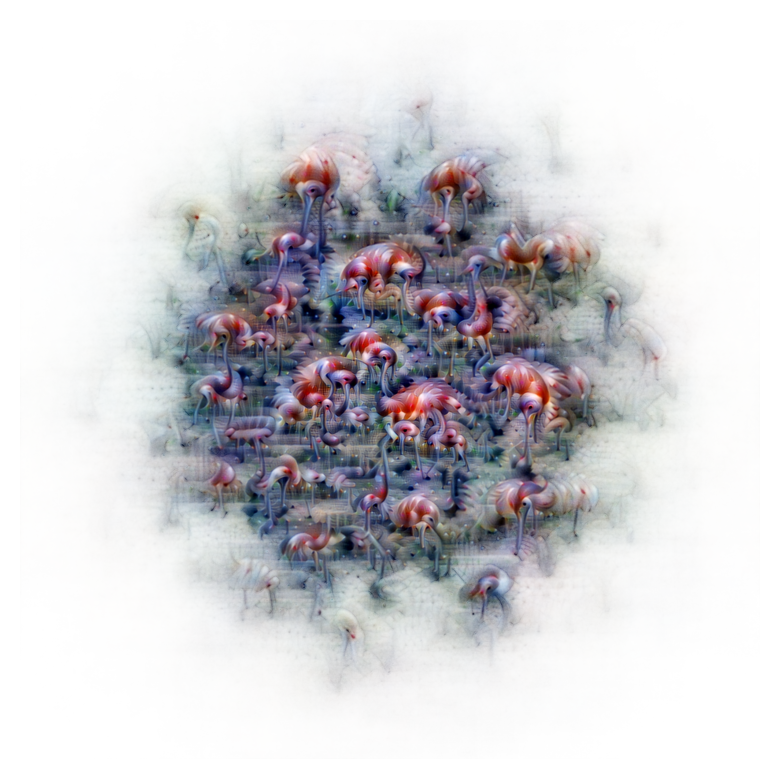

In [ ]:
plot_maco(image1, alpha1)
plt.savefig("maco.png", dpi=300)
plt.show()

It should be something like this:

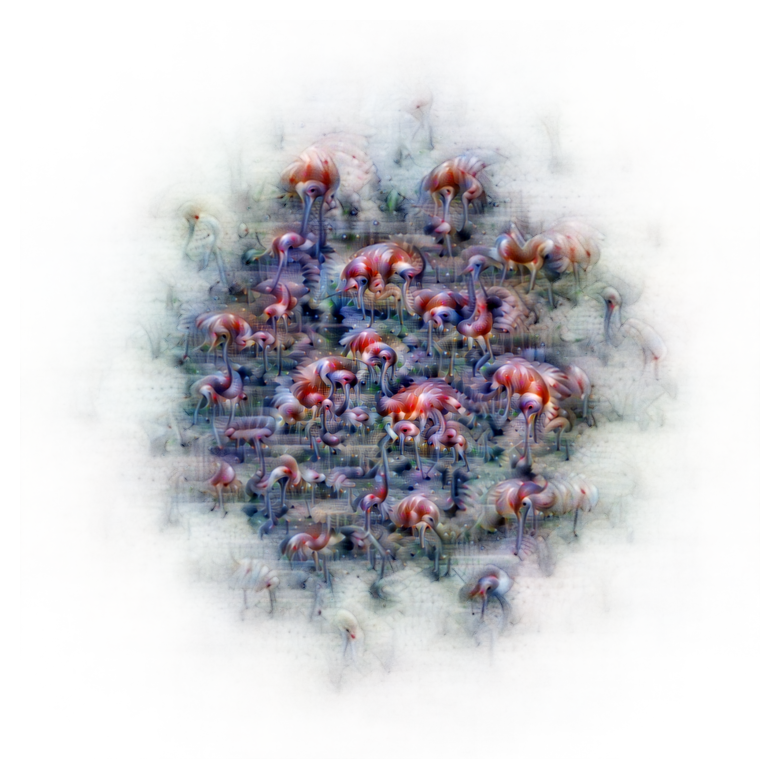

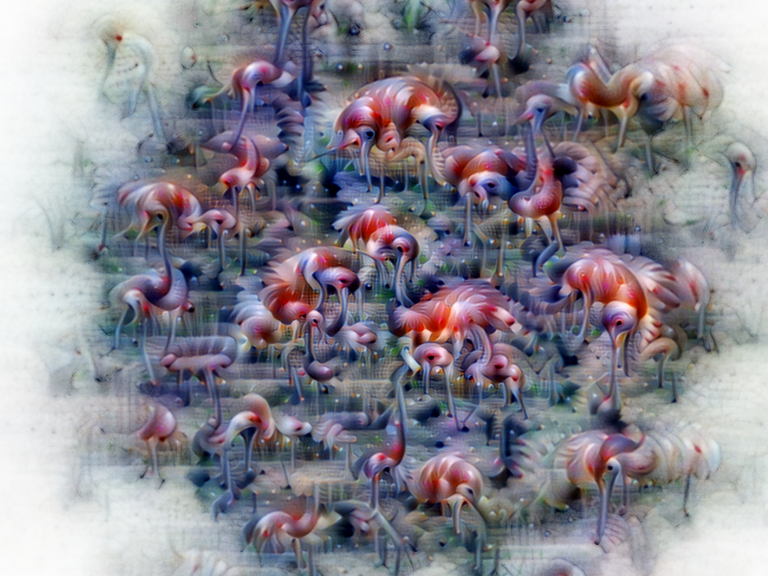

In [ ]:
img1 = Image.open("maco.png")
img1 = crop_center(img1, 0.4)
img1

In [ ]:
img1 = img1.convert('RGB')

img1_d = transform_support(img1)
img1_d = img1_d.to(device)

out1_d = support_model(img1_d.unsqueeze(0))
out1_d = out1_d.cpu()

prob1_d = torch.nn.functional.softmax(out1_d[0], dim=0)
pred_1 = torch.argmax(prob1_d)

print("Predicted class : ",imagenet_classes[pred_1.item()])
print("Linguistic explanation : ",img2text(img1))
print("Text similarity : ", text_similarity(imagenet_classes[unit], img2text(img1)))
print("CLIP score : ", CLIP_score(img1,imagenet_classes[unit]))

Predicted class :  flamingo
Linguistic explanation :  there are many flamingos that are standing in the water
Text similarity :  0.63641756772995
CLIP score :  30.17039


# References

T. Fel, T. Boissin, V. Boutin, A. Picard, P. Novello, J. Colin, D. Linsley,
T. Rousseau, R. Cadène, L. Goetschalckx, L. Gardes, and T. Serre, ‘‘Un
locking feature visualization for deep network with magnitude constrained
optimization,’’ in Advances in Neural Information Processing Systems
36: Annual Conference on Neural Information Processing Systems 2023,
NeurIPS 2023, New Orleans, LA, USA, December 10- 16, 2023 (A. Oh,
T. Naumann, A. Globerson, K. Saenko, M. Hardt, and S. Levine, eds.),
2023.

A. Mordvintsev, C. Olah, and M. Tyka, ‘‘Inceptionism: Going Deeper into
Neural Networks,’’ Google Research Blog, 2015.

K. Simonyan, ‘‘Deep inside convolutional networks: Visualising image
classification models and saliency maps,’’ arXiv preprint arXiv:1312.6034,
2013.

C.Olah, A.Mordvintsev, and L. Schubert, ‘‘Feature visualization,’’ Distill,
vol. 2, no. 11, p. e7, 2017.

C.Szegedy, W.Zaremba, I.Sutskever, J. Bruna, D. Erhan, I. J. Goodfellow,
and R. Fergus, ‘‘Intriguing properties of neural networks,’’ in 2nd Inter
national Conference on Learning Representations, ICLR 2014, Banff, AB,
Canada, April 14-16, 2014, Conference Track Proceedings (Y. Bengio and
Y. LeCun, eds.), 2014.

J. Yosinski, J. Clune, A. Nguyen, T. Fuchs, and H. Lipson, ‘‘Under
standing neural networks through deep visualization,’’ ArXiv preprint,
vol. abs/1506.06579, 2015.